In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")


In [2]:
ds=pd.read_csv("Insurance_Fraud.csv")
ds

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
ds.shape

(1000, 40)

In [4]:
ds.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [7]:
ds.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [9]:
ds.columns


Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

_c39 has al value has null so dropping that from the dataset 

In [10]:
ds=ds.drop("_c39",axis=1)
ds.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [18]:
for i in ds.columns:
    if ds[i].dtype==object:
        print(str(i))
        print(ds[i].value_counts())
        print("\n")

policy_bind_date
05-08-1992    3
28-04-1992    3
01-01-2006    3
16-07-2002    2
11-03-2010    2
             ..
08-04-2003    1
14-06-2004    1
18-08-1996    1
27-09-2011    1
23-08-2003    1
Name: policy_bind_date, Length: 951, dtype: int64


policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


policy_csl
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


insured_sex
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
h

We see  police_report_available,  property_damage,property_damage having data of ? so that replacing all ? int Nan

In [19]:
ds= ds.replace('?',np.NaN)



In [20]:
ds.isnull().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                  True
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In this we going to replace Collision_type with mode,property_damage with No,police_report_available with No


In [21]:
ds['collision_type'].fillna(ds['collision_type'].mode()[0], inplace = True)


ds['property_damage'].fillna('NO', inplace = True)

ds['police_report_available'].fillna('NO', inplace = True)

In [22]:
ds.isnull().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                 False
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [23]:
column=['collision_type','property_damage','police_report_available']

for i in ds[column]:
    if ds[i].dtype==object:
        print(str(i))
        print(ds[i].value_counts())
        print("\n")

collision_type
Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


property_damage
NO     698
YES    302
Name: property_damage, dtype: int64


police_report_available
NO     686
YES    314
Name: police_report_available, dtype: int64




All the null values has been removed from the dataset

In [24]:
ds.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


Visulazation

(array([ 16.,  74., 187., 147., 214., 139., 109.,  36.,  51.,  27.]),
 array([19. , 23.5, 28. , 32.5, 37. , 41.5, 46. , 50.5, 55. , 59.5, 64. ]),
 <BarContainer object of 10 artists>)

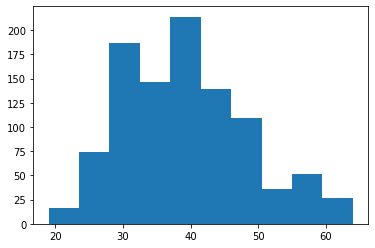

In [61]:
plt.hist(ds["age"],bins=10)

<AxesSubplot:xlabel='witnesses', ylabel='count'>

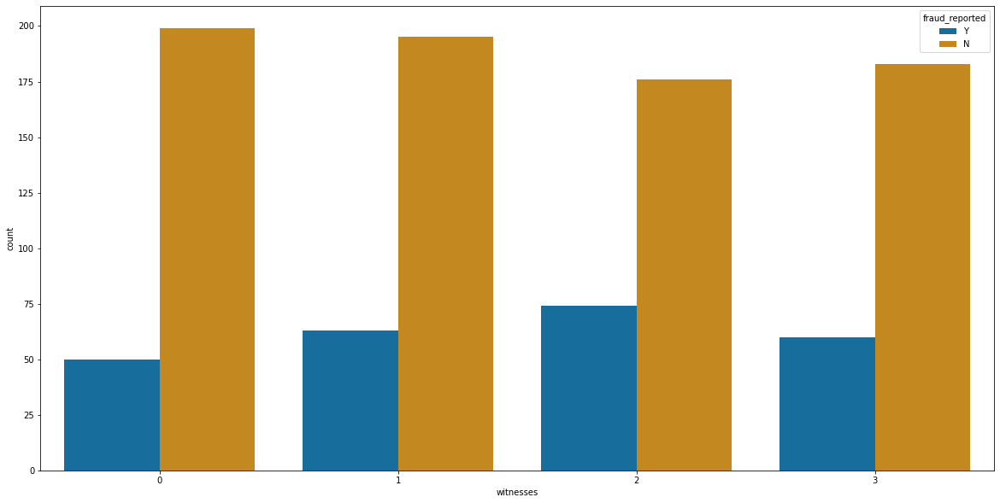

In [33]:
plt.subplots(figsize=(20,10))
sb.countplot(x="witnesses",hue="fraud_reported",data=ds, palette= "colorblind")

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

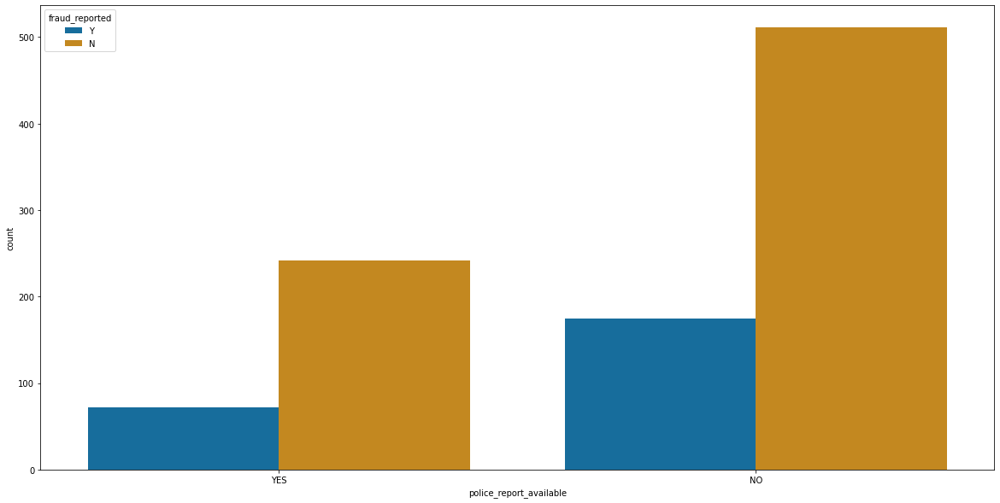

In [32]:
plt.subplots(figsize=(20,10))
sb.countplot(x="police_report_available",hue="fraud_reported",data=ds, palette= "colorblind")

We see that if there no report available the fraud value increased

<AxesSubplot:xlabel='collision_type', ylabel='count'>

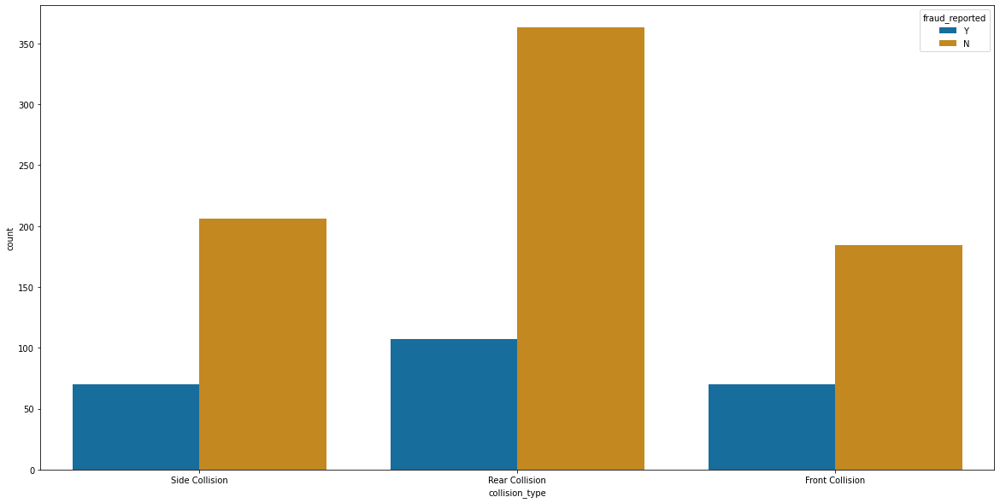

In [34]:
plt.subplots(figsize=(20,10))
sb.countplot(x="collision_type",hue="fraud_reported",data=ds, palette= "colorblind")

In [38]:
ds.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


<AxesSubplot:>

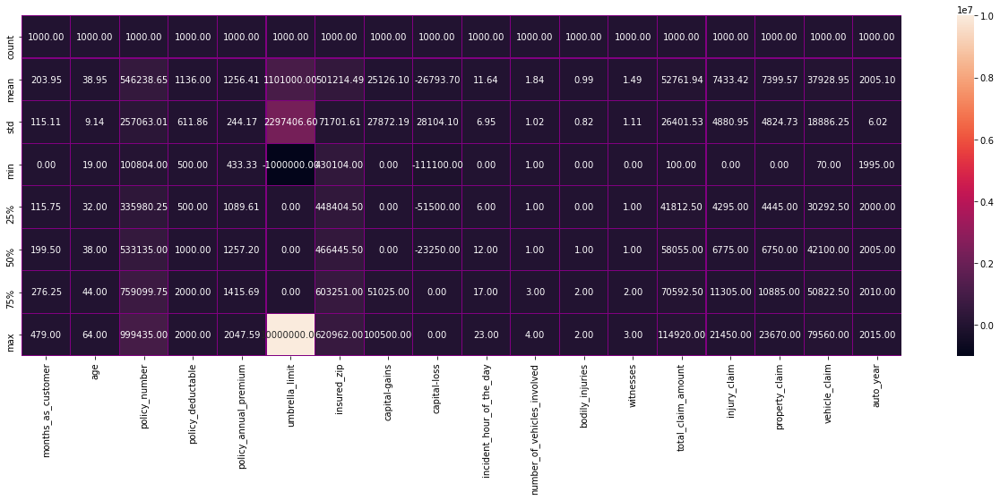

In [40]:
plt.figure(figsize=(22,7))
sb.heatmap(ds.describe(),annot=True,linewidths=0.1,linecolor="purple",fmt="0.2f")

In [36]:
ds.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368


<AxesSubplot:>

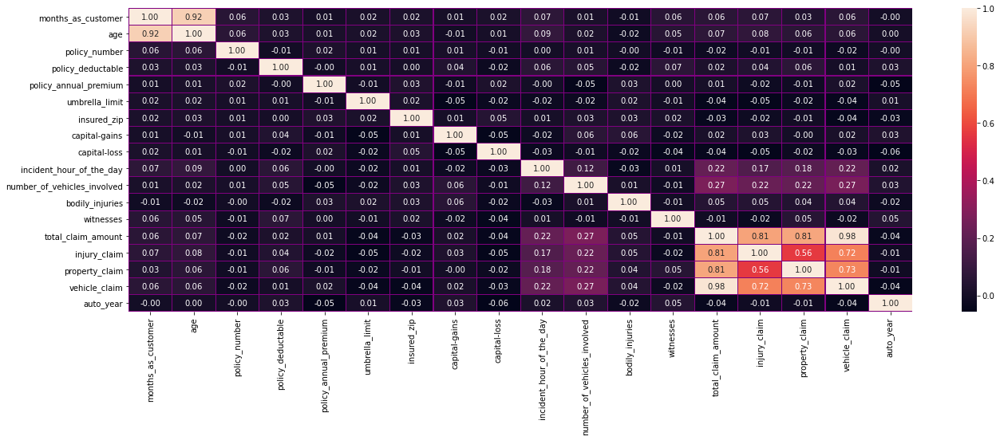

In [41]:
plt.figure(figsize=(22,7))
sb.heatmap(ds.corr(),annot=True,linewidths=0.1,linecolor="purple",fmt="0.2f")

Converting ordinal data is Numeric dataset

In [42]:
from sklearn.preprocessing import OrdinalEncoder
oec=OrdinalEncoder()

In [44]:
for i in ds.columns:
    if ds[i].dtypes=="object":
        ds[i]=oec.fit_transform(ds[i].values.reshape(-1,1))

In [45]:
ds.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,2,1.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,3,0.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,2,0.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,1,0.0,6500,1300,650,4550,0.0,31.0,2009,0.0


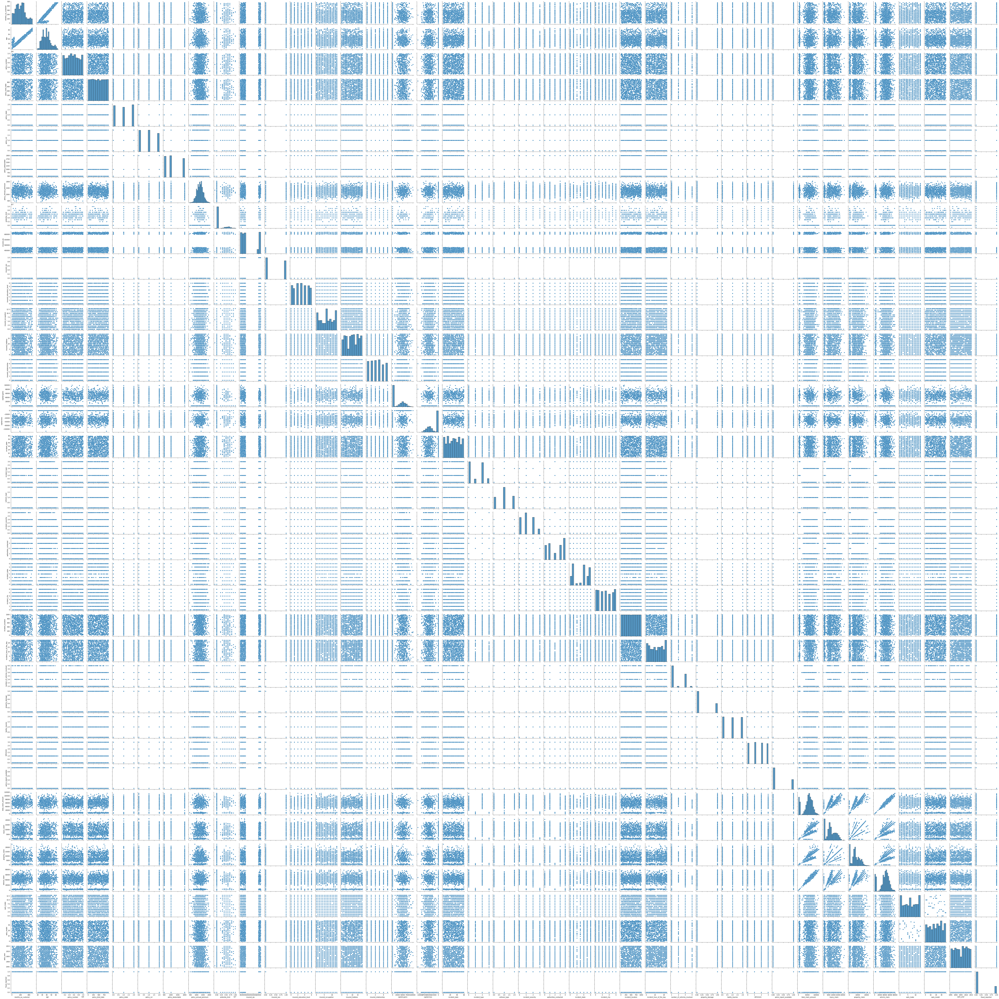

In [60]:
sb.pairplot(ds)

Converted all value as Numeric data set 

Checking for outliers

months_as_customer             AxesSubplot(0.125,0.863798;0.775x0.0162017)
age                            AxesSubplot(0.125,0.844356;0.775x0.0162017)
policy_number                  AxesSubplot(0.125,0.824914;0.775x0.0162017)
policy_bind_date               AxesSubplot(0.125,0.805472;0.775x0.0162017)
policy_state                    AxesSubplot(0.125,0.78603;0.775x0.0162017)
policy_csl                     AxesSubplot(0.125,0.766588;0.775x0.0162017)
policy_deductable              AxesSubplot(0.125,0.747146;0.775x0.0162017)
policy_annual_premium          AxesSubplot(0.125,0.727704;0.775x0.0162017)
umbrella_limit                 AxesSubplot(0.125,0.708262;0.775x0.0162017)
insured_zip                     AxesSubplot(0.125,0.68882;0.775x0.0162017)
insured_sex                    AxesSubplot(0.125,0.669378;0.775x0.0162017)
insured_education_level        AxesSubplot(0.125,0.649936;0.775x0.0162017)
insured_occupation             AxesSubplot(0.125,0.630494;0.775x0.0162017)
insured_hobbies          

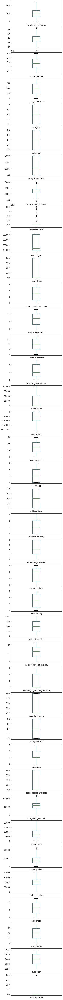

In [47]:
ds.plot(kind="box",subplots=True,figsize=(5,100),layout=(39,1))

We see that Umbrella_limit ,Policy_per_annum,property_claim as more Outiliers

Checking for Skewness

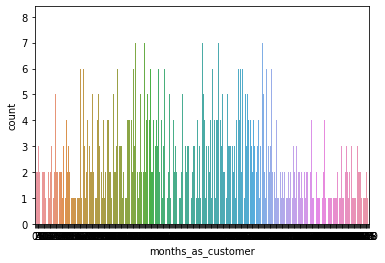

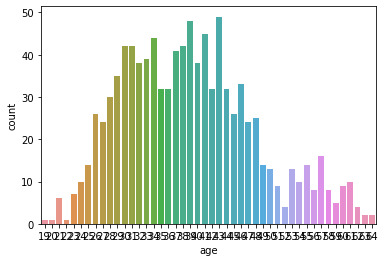

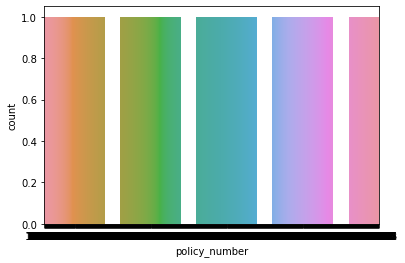

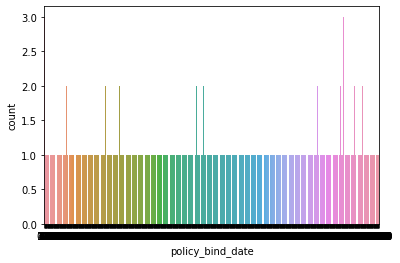

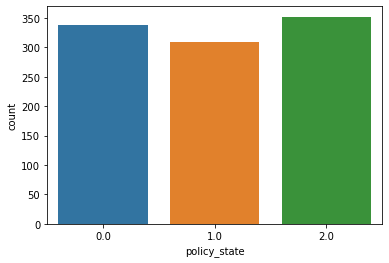

...

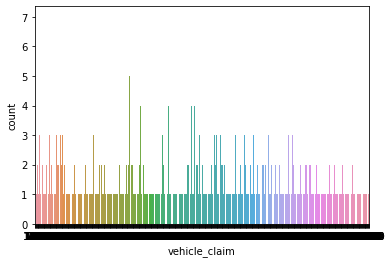

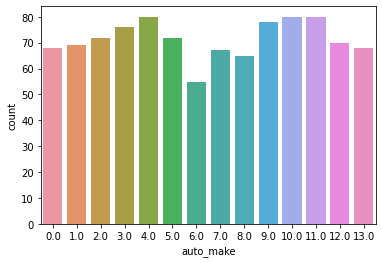

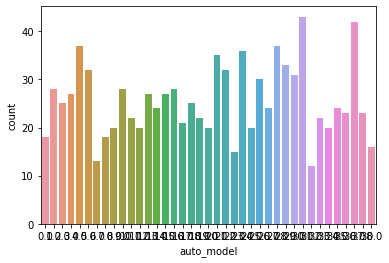

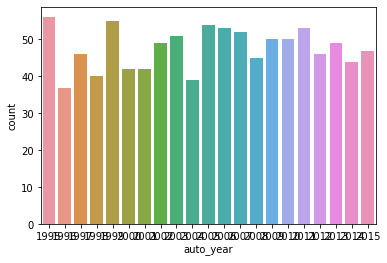

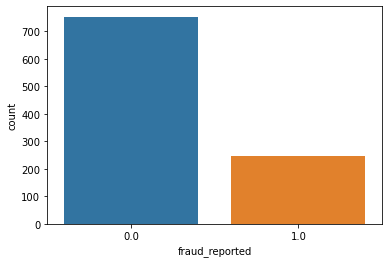

In [49]:
for  i in ds.columns:
    plt.figure()
    sb.countplot(ds[i])

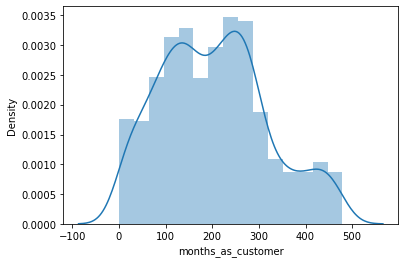

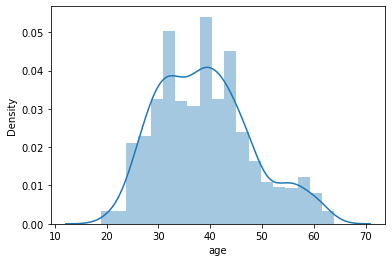

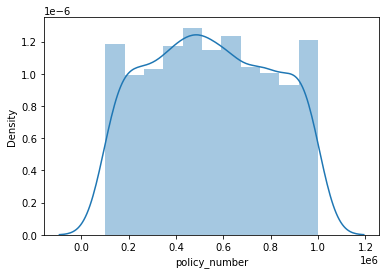

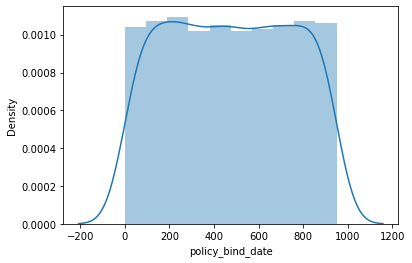

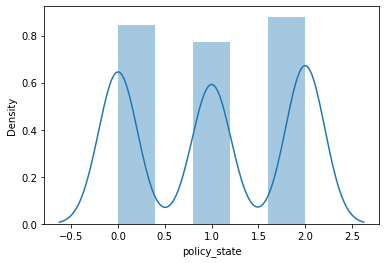

...

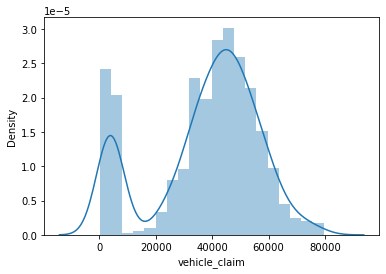

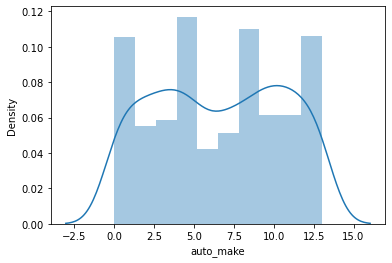

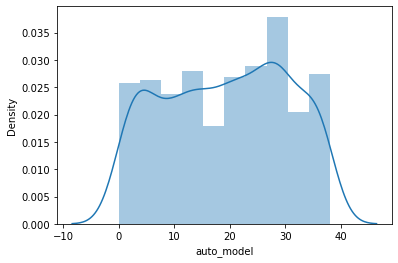

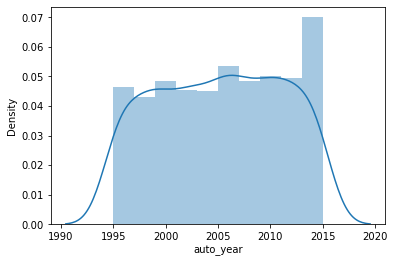

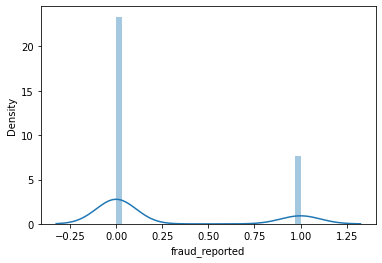

In [50]:
for  i in ds.columns:
    plt.figure()
    sb.distplot(ds[i])

In [52]:
ds.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.005194
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000


There is no much skewness availble and for the ordinal we need not to remove the skewness

<AxesSubplot:>

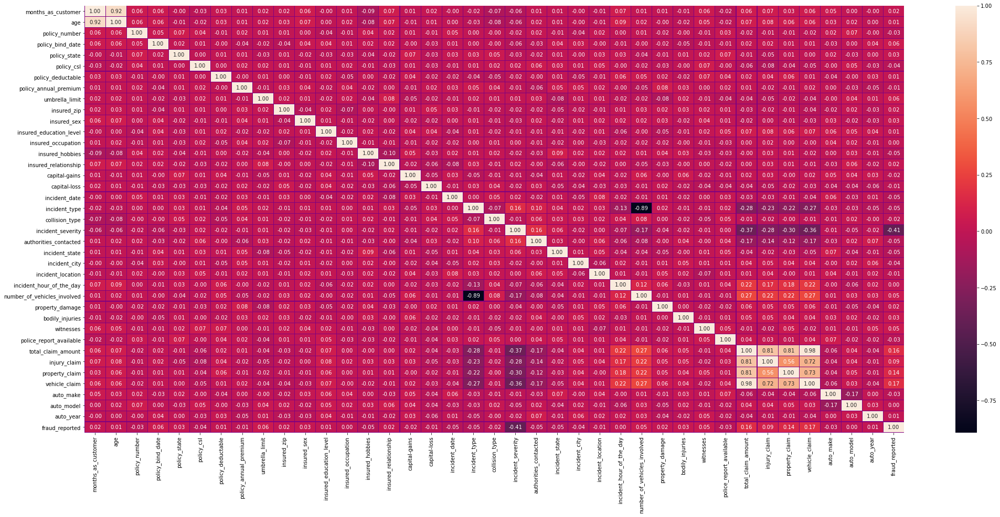

In [56]:
plt.figure(figsize=(35,15))
sb.heatmap(ds.corr(),annot=True,linewidths=0.1,linecolor="purple",fmt="0.2f")

In [58]:
ds.corr()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,...,0.058383,-0.022146,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544
age,0.922098,1.000000,0.059413,0.056538,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,...,0.052359,-0.020441,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.072815,0.038917,-0.006738,0.022566,0.008968,0.007083,...,-0.012661,0.031190,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.015289,0.008486,-0.001721,-0.037733,-0.024866,-0.042749,...,-0.007004,-0.011563,0.015901,0.024160,0.008611,0.013784,-0.025955,0.000306,0.035067,0.060642
policy_state,-0.000328,-0.014533,0.072815,0.015289,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,...,0.022960,0.069017,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432
policy_csl,-0.026819,-0.015185,0.038917,0.008486,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,...,0.071500,-0.001645,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.026807,0.029188,-0.006738,-0.001721,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,...,0.066639,0.038036,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,-0.037733,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,...,0.002332,0.021998,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,0.008968,-0.024866,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,...,-0.006738,-0.044771,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.007083,-0.042749,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,...,0.019805,0.009841,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368


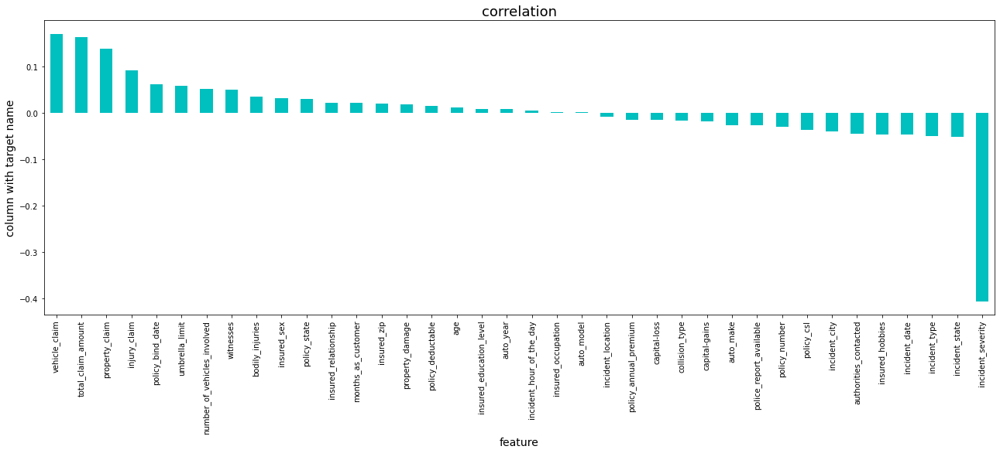

In [59]:
plt.figure(figsize=(22,7))
ds.corr()["fraud_reported"].sort_values(ascending=False).drop(["fraud_reported"]).plot(kind="bar",color="c")
plt.xlabel("feature",fontsize=14)
plt.ylabel("column with target name",fontsize=14)
plt.title("correlation",fontsize=18)
plt.show()

Incident_Severnity is bery high negatively correlated with Target variable

Spliting the data

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB  
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,precision_score,recall_score,classification_report,roc_curve 
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV



import warnings
warnings.filterwarnings("ignore")

In [68]:
x=ds.drop("fraud_reported",axis=1)
y=ds["fraud_reported"]

In [66]:
lr= LogisticRegression()
rfc=RandomForestClassifier()
dtc=DecisionTreeClassifier()
knn=KNeighborsClassifier()
svc=SVC()
gnb=GaussianNB()

In [69]:
for i in range (0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At the random state {i}, the Training accuracy is : {accuracy_score(y_train,pred_train)}")
    print(f"At the random state {i}, the Testing accuracy is : {accuracy_score(y_test,pred_test)}")
    print("\n")
    

At the random state 0, the Training accuracy is : 0.765
At the random state 0, the Testing accuracy is : 0.71


At the random state 1, the Training accuracy is : 0.76
At the random state 1, the Testing accuracy is : 0.73


At the random state 2, the Training accuracy is : 0.7525
At the random state 2, the Testing accuracy is : 0.755


At the random state 3, the Training accuracy is : 0.755
At the random state 3, the Testing accuracy is : 0.745


At the random state 4, the Training accuracy is : 0.77
At the random state 4, the Testing accuracy is : 0.69


At the random state 5, the Training accuracy is : 0.76375
At the random state 5, the Testing accuracy is : 0.725


At the random state 6, the Training accuracy is : 0.745
At the random state 6, the Testing accuracy is : 0.8


At the random state 7, the Training accuracy is : 0.76
At the random state 7, the Testing accuracy is : 0.745


At the random state 8, the Training accuracy is : 0.7525
At the random state 8, the Testing accuracy 

At the random state 72, the Testing accuracy is : 0.725


At the random state 73, the Training accuracy is : 0.75375
At the random state 73, the Testing accuracy is : 0.755


At the random state 74, the Training accuracy is : 0.7625
At the random state 74, the Testing accuracy is : 0.715


At the random state 75, the Training accuracy is : 0.7475
At the random state 75, the Testing accuracy is : 0.785


At the random state 76, the Training accuracy is : 0.75125
At the random state 76, the Testing accuracy is : 0.755


At the random state 77, the Training accuracy is : 0.75125
At the random state 77, the Testing accuracy is : 0.77


At the random state 78, the Training accuracy is : 0.76
At the random state 78, the Testing accuracy is : 0.74


At the random state 79, the Training accuracy is : 0.7425
At the random state 79, the Testing accuracy is : 0.8


At the random state 80, the Training accuracy is : 0.75375
At the random state 80, the Testing accuracy is : 0.755


At the random st

In [80]:
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for j in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At the cross fold{j} the cv score is {cv_mean} and accuracy score for training is {train_accuracy} and accuracy for the testing is {test_accuracy}")
    print("\n")

At the cross fold2 the cv score is 0.753 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold3 the cv score is 0.7429884974795155 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold4 the cv score is 0.75 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold5 the cv score is 0.751 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold6 the cv score is 0.750006012072241 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold7 the cv score is 0.7520015196071533 and accuracy score for training is -0.3488484123622291 and accuracy for the testing is -0.2987012987012987


At the cross fold8 the cv score is 0.753 and accuracy score for

In [70]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=15)

In [71]:
lr.fit(x_train,y_train)

LogisticRegression()

In [72]:
predlr=lr.predict(x_test)
print(accuracy_score(y_test,predlr))
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

0.77
[[152   2]
 [ 44   2]]
              precision    recall  f1-score   support

         0.0       0.78      0.99      0.87       154
         1.0       0.50      0.04      0.08        46

    accuracy                           0.77       200
   macro avg       0.64      0.52      0.47       200
weighted avg       0.71      0.77      0.69       200



In [75]:
ds["fraud_reported"].value_counts()

0.0    753
1.0    247
Name: fraud_reported, dtype: int64

In [81]:
model=[lr,rfc,dtc,knn,svc,gnb]

for i in model:
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    print("Accuracy_Score: of",i)
    print(accuracy_score(y_test,pred))
    print(confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    score=cross_val_score(i,x,y,cv=5)
    print(score)
    print(score.mean())
    print("-------------------------------------------------")
    

Accuracy_Score: of LogisticRegression()
0.77
[[152   2]
 [ 44   2]]
              precision    recall  f1-score   support

         0.0       0.78      0.99      0.87       154
         1.0       0.50      0.04      0.08        46

    accuracy                           0.77       200
   macro avg       0.64      0.52      0.47       200
weighted avg       0.71      0.77      0.69       200

[0.75  0.755 0.74  0.755 0.755]
0.751
-------------------------------------------------
Accuracy_Score: of RandomForestClassifier()
0.8
[[142  12]
 [ 28  18]]
              precision    recall  f1-score   support

         0.0       0.84      0.92      0.88       154
         1.0       0.60      0.39      0.47        46

    accuracy                           0.80       200
   macro avg       0.72      0.66      0.68       200
weighted avg       0.78      0.80      0.78       200

[0.795 0.765 0.75  0.785 0.78 ]
0.775
-------------------------------------------------
Accuracy_Score: of DecisionTree

We see that Random forest classiefier model perfomring better than other models

In [87]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

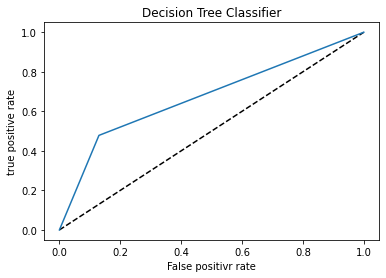

In [88]:
y_pred_prob=dtc.predict_proba(x_test)[:,1]
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="DecisionTreeClassifier")
plt.xlabel("False positivr rate")
plt.ylabel("true positive rate")
plt.title("Decision Tree Classifier")
plt.show()

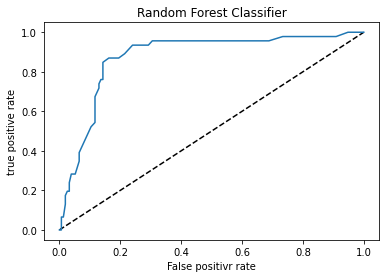

In [89]:
y_pred_prob=rfc.predict_proba(x_test)[:,1]
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="RandomForestClassifier")
plt.xlabel("False positivr rate")
plt.ylabel("true positive rate")
plt.title("Random Forest Classifier")
plt.show()

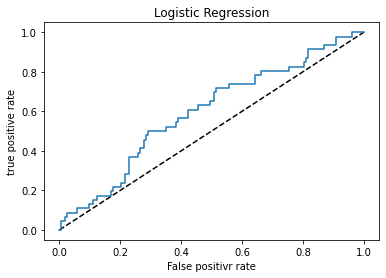

In [90]:
y_pred_prob=lr.predict_proba(x_test)[:,1]
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
fpr,tpr,threseholds=roc_curve(y_test,y_pred_prob)
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="Logistic Regression")
plt.xlabel("False positivr rate")
plt.ylabel("true positive rate")
plt.title("Logistic Regression")
plt.show()

In [83]:
parameters={"criterion":['gini', 'entropy'],"max_features":["auto","sqrt","log2"]}
clf=GridSearchCV(rfc,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'criterion': 'gini', 'max_features': 'auto'}


In [85]:
rfc=RandomForestClassifier(criterion="gini",max_features="auto")
rfc.fit(x_train,y_train)
predrfc=rfc.predict(x_test)
print(accuracy_score(y_test,predrfc))
print(confusion_matrix(y_test,predrfc))
print(classification_report(y_test,predrfc))
score=cross_val_score(i,x,y,cv=5)
print("Cross Val Score",score*100)

0.8
[[144  10]
 [ 30  16]]
              precision    recall  f1-score   support

         0.0       0.83      0.94      0.88       154
         1.0       0.62      0.35      0.44        46

    accuracy                           0.80       200
   macro avg       0.72      0.64      0.66       200
weighted avg       0.78      0.80      0.78       200

Cross Val Score [72.  67.  55.  72.5 69.5]


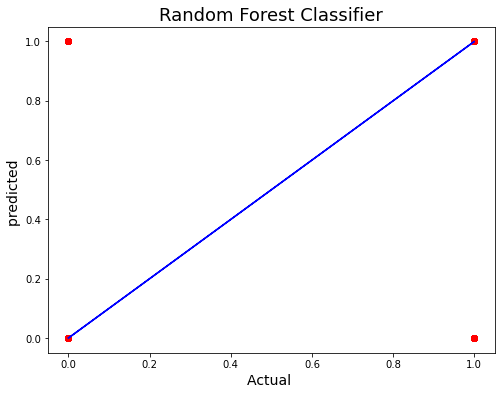

In [91]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=predrfc,color="r")
plt.plot(y_test,y_test,color="b")
plt.xlabel("Actual ",fontsize=14)
plt.ylabel("predicted ", fontsize=14)
plt.title("Random Forest Classifier",fontsize=18)
plt.show()

In [92]:
import pickle
filename="Insurance.pkl"
pickle.dump(rfc,open(filename,"wb"))

In [93]:
loaded_model=pickle.load(open('Insurance.pkl',"rb"))
result=loaded_model.score(x_test,y_test)
print(result)

0.8


In [94]:
Conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],predrfc[:]],index=["predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
predicted,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Original,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [96]:
sc=StandardScaler()

In [100]:
Future_pred=[['328','48','521585','17.0','1.0','250','1000','1406.91','0','466132','3.0','3.0','1.0','53300','0','2.0','2.0','1.0','1.0','1.0','2.0','5.0','9935' ,'4.0' ,'5.0','5','1','1','1','2','0','71610','6510','13020','52080','1.0','3.0','2004',]]
feature_pred_sur= sc.fit_transform(Future_pred)

pred= rfc.predict(Future_pred)
print(pred)

[0.]
